In [116]:
suppressPackageStartupMessages(library(readxl))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(tidyr))
suppressPackageStartupMessages(library(tibble))
suppressPackageStartupMessages(library(patchwork))
suppressPackageStartupMessages(library(pheatmap))
suppressPackageStartupMessages(library(stringr))
library(hise)
library(plyr)
library(purrr)
library(vegan)
#library(arrow)
library(rstatix)
library(parallel)
library(ggpubr)
library(ComplexHeatmap)
library(compositions)
library(ggsci)

ERROR: Error in library(compositions): there is no package called ‘compositions’


In [14]:
colors = c('#FDC086','#FFFF99','#F0027F','#BF5B17','#666666',
          '#1B9E77','#D95F02','#7570B3','#E7298A','#66A61E','#E6AB02','#A6761D','#666666',
          '#A6CEE3','#1F78B4','#B2DF8A','#33A02C','#FB9A99','#E31A1C','#FDBF6F','#FF7F00',
          '#CAB2D6','#6A3D9A','#FFFF99','#B15928','#FBB4AE','#B3CDE3','#CCEBC5','#DECBE4',
          '#FED9A6','#FFFFCC','#E5D8BD','#FDDAEC','#F2F2F2','#B3E2CD','#FDCDAC','#CBD5E8',
          '#F4CAE4','#E6F5C9','#FFF2AE','#F1E2CC','#CCCCCC','#E41A1C','#377EB8','#4DAF4A',
          '#984EA3','#FF7F00','#FFFF33','#A65628','#F781BF','#999999','#66C2A5','#FC8D62',
          '#8DA0CB','#E78AC3','#A6D854','#FFD92F','#E5C494','#B3B3B3','#8DD3C7','#FFFFB3',
          '#BEBADA','#FB8072','#80B1D3','#FDB462','#B3DE69','#FCCDE5','#D9D9D9','#BC80BD',
          '#CCEBC5','#FFED6F')

# Reading the file

In [3]:
# Read the CSV file into a data frame
myeloid_df <- read.csv('/home/jupyter/Myeloid_cells/files/Parquet_files/AIFI_Reference_processed.csv')


In [4]:
#remove UPI from the cohort
myeloid_df <- myeloid_df %>% filter(cohort.cohortGuid != 'UP1')

In [5]:
colnames(myeloid_df)

[1] "barcodes"                              
 [2] "barcodes.1"                            
 [3] "batch_id"                              
 [4] "cell_name"                             
 [5] "cell_uuid"                             
 [6] "chip_id"                               
 [7] "hto_barcode"                           
 [8] "hto_category"                          
 [9] "n_genes"                               
[10] "n_mito_umis"                           
[11] "n_reads"                               
[12] "n_umis"                                
[13] "original_barcodes"                     
[14] "pbmc_sample_id"                        
[15] "pool_id"                               
[16] "seurat_pbmc_type"                      
[17] "seurat_pbmc_type_score"                
[18] "umap_1"                                
[19] "umap_2"                                
[20] "well_id"                               
[21] "subject.biologicalSex"                 
[22] "subject.ethnicity"                     
[23] "subject.partnerCode"                   
[24] "subject.race"                          
[25] "subject.subjectGuid"                   
[26] "cohort.cohortGuid"                     
[27] "sample.visitName"                      
[28] "sample.visitDetails"                   
[29] "subject.birthYear"                     
[30] "CMV.IgG.Serology.Result.Interpretation"
[31] "BMI"                                   
[32] "predicted.celltype.l1.score"           
[33] "predicted.celltype.l1"                 
[34] "predicted.celltype.l2.score"           
[35] "predicted.celltype.l2"                 
[36] "predicted.celltype.l3.score"           
[37] "predicted.celltype.l3"                 
[38] "predicted.celltype.l2.5.score"         
[39] "predicted.celltype.l2.5"               
[40] "predicted_labels_celltypist"           
[41] "majority_voting_celltypist"            
[42] "predicted_doublet"                     
[43] "doublet_score"                         
[44] "n_genes_by_counts"                     
[45] "log1p_n_genes_by_counts"               
[46] "total_counts"                          
[47] "log1p_total_counts"                    
[48] "pct_counts_in_top_50_genes"            
[49] "pct_counts_in_top_100_genes"           
[50] "pct_counts_in_top_200_genes"           
[51] "pct_counts_in_top_500_genes"           
[52] "total_counts_mito"                     
[53] "log1p_total_counts_mito"               
[54] "pct_counts_mito"                       
[55] "leiden"                                
[56] "leiden_resolution_1"                   
[57] "leiden_resolution_1.5"                 
[58] "leiden_resolution_2"                   
[59] "AIFI_L1"                               
[60] "AIFI_L2"                               
[61] "AIFI_L3"                               
[62] "AIFI_L3.5"                             
[63] "cluster_dummy"

In [6]:
rownames(myeloid_df)<-myeloid_df$cell_uuid

In [ ]:
#length(unique(myeloid_df$subject.subjectGuid))

In [ ]:
#unique(myeloid_df$AIFI_L1)

In [ ]:
#head(myeloid_df)

# CLR Transform


In [7]:
clr_transform <- function(x) {
  if (length(x) == 0) {
    return(NA)  # return NA for empty vectors
  }
  geom_mean <- exp(mean(log(x)))
  return(log(x / geom_mean))
}

# Comparsion within toal PBMCs (Percentage and Percentage CLR)

In [69]:
## Percentage of total

result <- myeloid_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(result)
#sum(result$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
ASDC,BR1001,6,0.03236770,-2.232976
ASDC,BR1002,5,0.02637409,-2.242500
ASDC,BR1003,4,0.02094680,-2.763896
ASDC,BR1004,3,0.01710571,-2.626914
ASDC,BR1005,5,0.02809620,-1.943233
ASDC,BR1006,4,0.02300966,-2.337902


In [ ]:
sum(result$percentage)

In [ ]:
result %>% filter(subject.subjectGuid == "BR1001")

In [70]:
result %>% filter(subject.subjectGuid == "BR1001") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

[1] 100

In [71]:
result<-left_join(result,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [ ]:
head(result)
result %>% filter(subject.subjectGuid == "BR1001") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


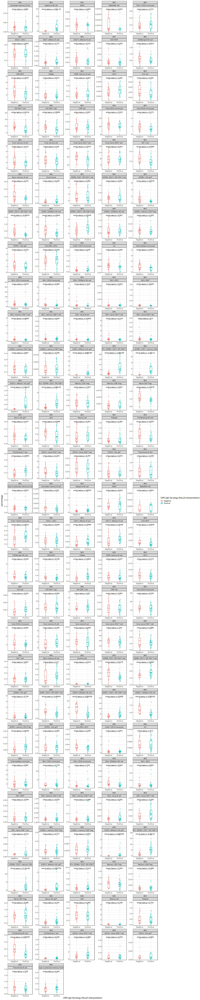

In [72]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 100)

stat.test <- result %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

In [ ]:
##percentage-CLR comparsion by CMV (haven't executed)

options(repr.plot.width = 18, repr.plot.height = 12)

stat.test <- result %>% select(percentage_clr,celltypes,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(celltypes,CMV.IgG.Serology.Result.Interpretation) %>%
  wilcox_test(percentage_clr ~ cohort.cohortGuid)

max_values<-result %>%
  group_by(celltypes,CMV.IgG.Serology.Result.Interpretation) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull()+1
stat.test$y.position<-max_values
ggplot(result , aes(cohort.cohortGuid, percentage_clr,color=cohort.cohortGuid)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+scale_color_d3()+
facet_wrap(~CMV.IgG.Serology.Result.Interpretation+celltypes,scale="free",ncol=7)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


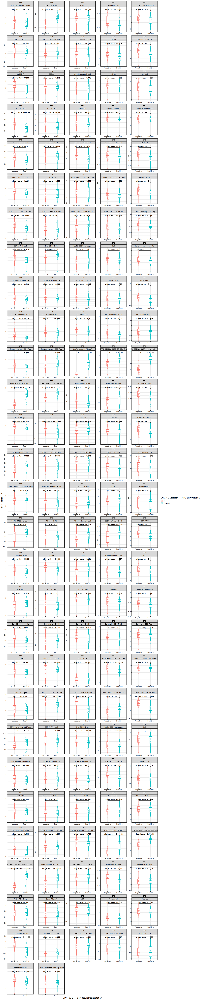

In [73]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 100)

stat.test <- result %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

# Comparsion within B cells(Percentage and Percentage CLR - AIFI Level 1 celltypes)¶

In [15]:
Bcell_df <- myeloid_df %>% filter(AIFI_L1 == 'B cell')

In [16]:
unique(Bcell_df$AIFI_L1)

[1] "B cell"

In [17]:
## Percentage of total

result_Bcell <- Bcell_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(result_Bcell)
#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
Activated memory B cell,BR1001,4,0.2263724,-2.423287
Activated memory B cell,BR1003,5,0.2967359,-2.198496
Activated memory B cell,BR1004,1,0.1157407,-3.250288
Activated memory B cell,BR1005,2,0.1912046,-2.504078
Activated memory B cell,BR1006,4,0.1989060,-2.254741
Activated memory B cell,BR1007,4,0.2877698,-2.440513


In [18]:
result_Bcell<-left_join(result_Bcell,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [19]:
head(result_Bcell)

AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
Activated memory B cell,BR1001,4,0.2263724,-2.423287,BR1,Female,Negative
Activated memory B cell,BR1003,5,0.2967359,-2.198496,BR1,Female,Negative
Activated memory B cell,BR1004,1,0.1157407,-3.250288,BR1,Male,Negative
Activated memory B cell,BR1005,2,0.1912046,-2.504078,BR1,Female,Negative
Activated memory B cell,BR1006,4,0.1989060,-2.254741,BR1,Male,Negative
Activated memory B cell,BR1007,4,0.2877698,-2.440513,BR1,Male,Positive


In [20]:
result_Bcell %>% filter(subject.subjectGuid == "BR1001") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

[1] 100

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


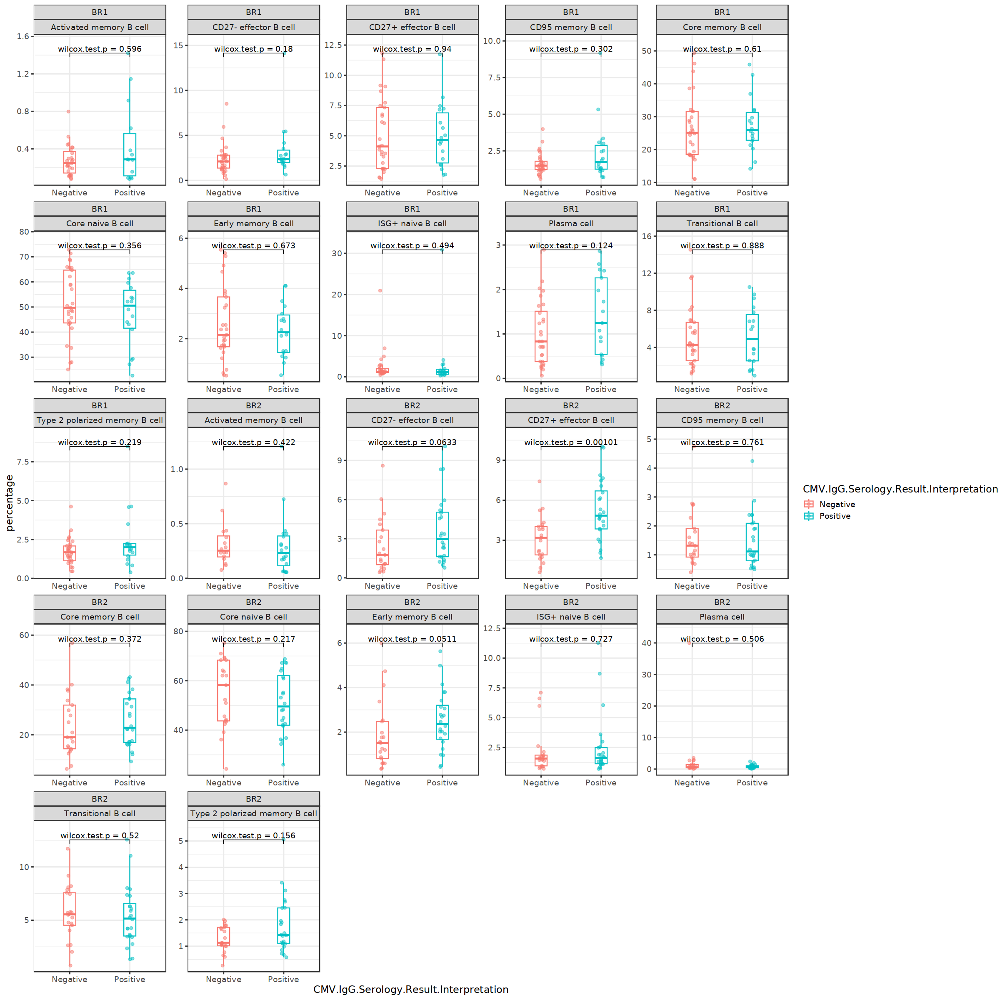

In [21]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 20)

stat.test <- result_Bcell %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result_Bcell %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result_Bcell, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


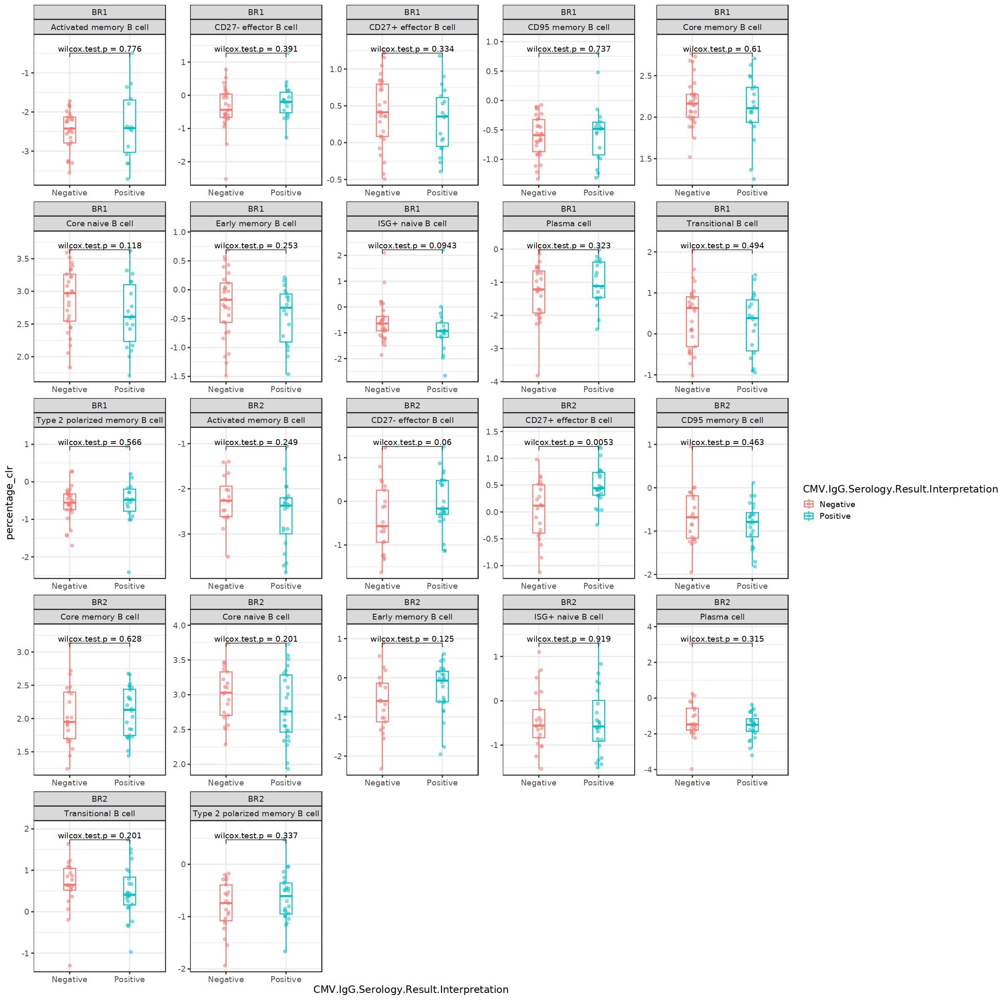

In [22]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 20)

stat.test <- result_Bcell %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result_Bcell %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result_Bcell, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

# Comparsion within T cell (Percentage and Percentage CLR - AIFI Level 1 celltypes)¶

In [23]:
Tcell_df <- myeloid_df %>% filter(AIFI_L1 == 'T cell')

In [24]:
unique(Tcell_df$AIFI_L1)

[1] "T cell"

In [57]:
## Percentage of total

result_Tcell <- Tcell_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(result_Tcell)
head(Tcell_df)
#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
CD4 MAIT,BR1001,55,0.48941093,-0.2869015
CD4 MAIT,BR1002,8,0.06584362,-2.1593283
CD4 MAIT,BR1003,26,0.20722085,-1.1121389
CD4 MAIT,BR1004,42,0.32292788,-0.2297369
CD4 MAIT,BR1005,11,0.11689692,-1.3145878
CD4 MAIT,BR1006,23,0.23431133,-0.6821057


,barcodes,barcodes.1,batch_id,cell_name,cell_uuid,chip_id,hto_barcode,hto_category,n_genes,n_mito_umis,⋯,pct_counts_mito,leiden,leiden_resolution_1,leiden_resolution_1.5,leiden_resolution_2,AIFI_L1,AIFI_L2,AIFI_L3,AIFI_L3.5,cluster_dummy
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,⋯,<dbl>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
cf71f47048b611ea8957bafe6d70929e,cf71f47048b611ea8957bafe6d70929e,cf71f47048b611ea8957bafe6d70929e,B001,weathered_pernicious_polliwog,cf71f47048b611ea8957bafe6d70929e,B001-P1C1,TGATGGCCTATTGGG,singlet,1081,115,⋯,4.032258,10,9,11,10,T cell,MAIT,CD8 MAIT,CD8 MAIT,False
cf71fb7848b611ea8957bafe6d70929e,cf71fb7848b611ea8957bafe6d70929e,cf71fb7848b611ea8957bafe6d70929e,B001,long_weakminded_roebuck,cf71fb7848b611ea8957bafe6d70929e,B001-P1C1,TGATGGCCTATTGGG,singlet,1118,77,⋯,2.071006,2,7,4,3,T cell,Memory CD4 T cell,CM CD4 T cell,CM CD4 T cell,False
cf7216a848b611ea8957bafe6d70929e,cf7216a848b611ea8957bafe6d70929e,cf7216a848b611ea8957bafe6d70929e,B001,bimetallic_returnable_pony,cf7216a848b611ea8957bafe6d70929e,B001-P1C1,TGATGGCCTATTGGG,singlet,1836,249,⋯,4.098091,2,6,8,6,T cell,Memory CD4 T cell,GZMB- CD27+ EM CD4 T cell,GZMB- CD27+ EM CD4 T cell,False
cf72178448b611ea8957bafe6d70929e,cf72178448b611ea8957bafe6d70929e,cf72178448b611ea8957bafe6d70929e,B001,newsworthy_copacetic_halicore,cf72178448b611ea8957bafe6d70929e,B001-P1C1,TGATGGCCTATTGGG,singlet,928,60,⋯,2.130682,1,0,1,0,T cell,Naive CD4 T cell,Core naive CD4 T cell,Core naive CD4 T cell,False
cf7224c248b611ea8957bafe6d70929e,cf7224c248b611ea8957bafe6d70929e,cf7224c248b611ea8957bafe6d70929e,B001,chic_mahogany_caribou,cf7224c248b611ea8957bafe6d70929e,B001-P1C1,TGATGGCCTATTGGG,singlet,951,122,⋯,5.640314,7,2,6,4,T cell,Naive CD8 T cell,Core naive CD8 T cell,Core naive CD8 T cell,False
cf7226c048b611ea8957bafe6d70929e,cf7226c048b611ea8957bafe6d70929e,cf7226c048b611ea8957bafe6d70929e,B001,first_illegible_megaraptor,cf7226c048b611ea8957bafe6d70929e,B001-P1C1,TGATGGCCTATTGGG,singlet,1021,157,⋯,5.323839,4,1,4,3,T cell,Memory CD4 T cell,CM CD4 T cell,CM CD4 T cell,False


In [26]:
result_Tcell<-left_join(result_Tcell,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [27]:
head(result_Tcell)

AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
CD4 MAIT,BR1001,55,0.48941093,-0.2869015,BR1,Female,Negative
CD4 MAIT,BR1002,8,0.06584362,-2.1593283,BR1,Male,Negative
CD4 MAIT,BR1003,26,0.20722085,-1.1121389,BR1,Female,Negative
CD4 MAIT,BR1004,42,0.32292788,-0.2297369,BR1,Male,Negative
CD4 MAIT,BR1005,11,0.11689692,-1.3145878,BR1,Female,Negative
CD4 MAIT,BR1006,23,0.23431133,-0.6821057,BR1,Male,Negative


In [28]:
result_Tcell %>% filter(subject.subjectGuid == "BR1001") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

[1] 100

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


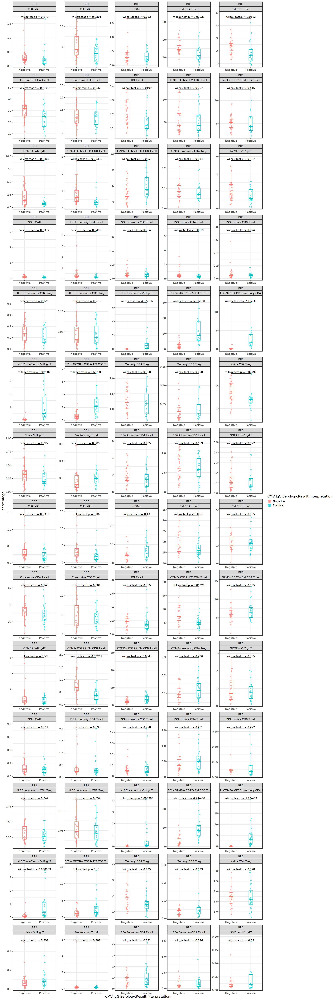

In [29]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 60)

stat.test <- result_Tcell %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result_Tcell %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result_Tcell, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


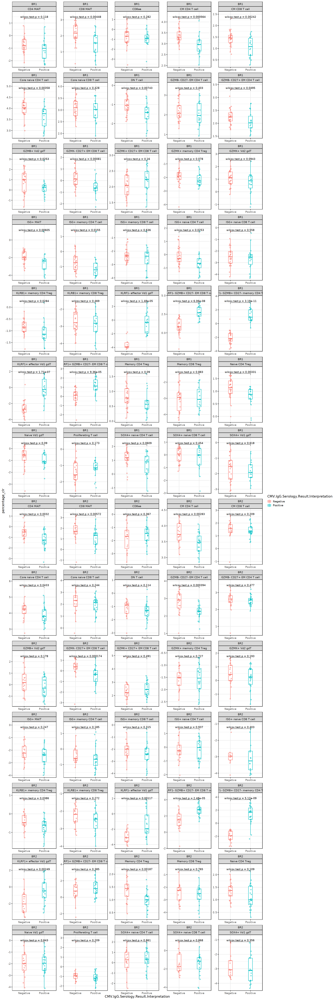

In [30]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 60)

stat.test <- result_Tcell %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result_Tcell %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result_Tcell, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

# Comparsion within Monocyte  (Percentage and Percentage CLR - AIFI Level 1 celltypes)

In [31]:
monocyte_df <- myeloid_df %>% filter(AIFI_L1 == 'Monocyte')

In [32]:
unique(monocyte_df$AIFI_L1)

[1] "Monocyte"

In [33]:
## Percentage of total

result_monocyte <- monocyte_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(result_monocyte)
#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
C1Q+ CD16 monocyte,BR1001,117,2.9396985,-0.501638
C1Q+ CD16 monocyte,BR1002,20,0.5844535,-1.842195
C1Q+ CD16 monocyte,BR1003,41,1.1801957,-1.767540
C1Q+ CD16 monocyte,BR1004,4,0.2144772,-3.079874
C1Q+ CD16 monocyte,BR1005,25,0.3788453,-2.029338
C1Q+ CD16 monocyte,BR1006,45,1.2142472,-1.339048


In [34]:
result_monocyte<-left_join(result_monocyte,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [35]:
head(result_monocyte)

AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
C1Q+ CD16 monocyte,BR1001,117,2.9396985,-0.501638,BR1,Female,Negative
C1Q+ CD16 monocyte,BR1002,20,0.5844535,-1.842195,BR1,Male,Negative
C1Q+ CD16 monocyte,BR1003,41,1.1801957,-1.767540,BR1,Female,Negative
C1Q+ CD16 monocyte,BR1004,4,0.2144772,-3.079874,BR1,Male,Negative
C1Q+ CD16 monocyte,BR1005,25,0.3788453,-2.029338,BR1,Female,Negative
C1Q+ CD16 monocyte,BR1006,45,1.2142472,-1.339048,BR1,Male,Negative


In [36]:
result_monocyte %>% filter(subject.subjectGuid == "BR1006") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

[1] 100

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


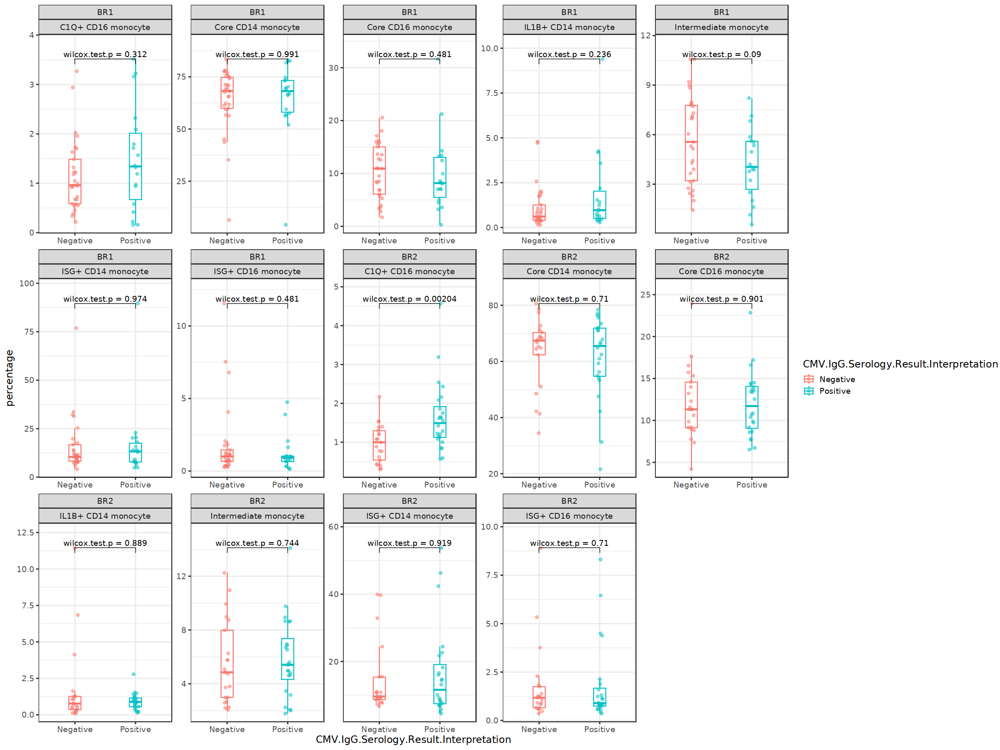

In [37]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 15)

stat.test <- result_monocyte %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result_monocyte %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result_monocyte, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


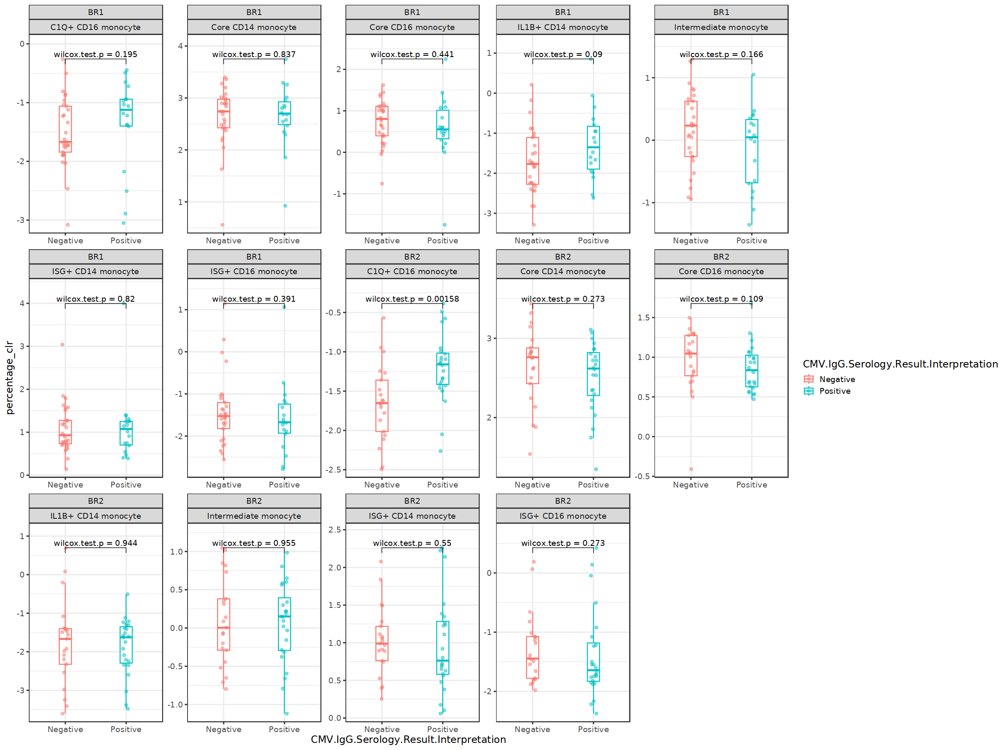

In [38]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 15)

stat.test <- result_monocyte %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result_monocyte %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(result_monocyte, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

# Comparsion within DC (Percentage and Percentage CLR - AIFI Level 1 celltypes)

In [39]:
DC_df <- myeloid_df %>% filter(AIFI_L1 == 'DC')

In [40]:
unique(DC_df$AIFI_L1)

[1] "DC"

In [41]:
## Percentage of total

DC_df <- DC_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(DC_df)
#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
ASDC,BR1001,6,2.352941,-1.245945
ASDC,BR1002,5,1.373626,-1.468424
ASDC,BR1003,4,1.716738,-1.765055
ASDC,BR1004,3,1.321586,-1.798546
ASDC,BR1005,5,1.915709,-1.164980
ASDC,BR1006,4,1.562500,-1.552766


In [42]:
DC_df<-left_join(DC_df,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [43]:
head(DC_df)

AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ASDC,BR1001,6,2.352941,-1.245945,BR1,Female,Negative
ASDC,BR1002,5,1.373626,-1.468424,BR1,Male,Negative
ASDC,BR1003,4,1.716738,-1.765055,BR1,Female,Negative
ASDC,BR1004,3,1.321586,-1.798546,BR1,Male,Negative
ASDC,BR1005,5,1.915709,-1.164980,BR1,Female,Negative
ASDC,BR1006,4,1.562500,-1.552766,BR1,Male,Negative


In [44]:
DC_df %>% filter(subject.subjectGuid == "BR1007") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

[1] 100

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


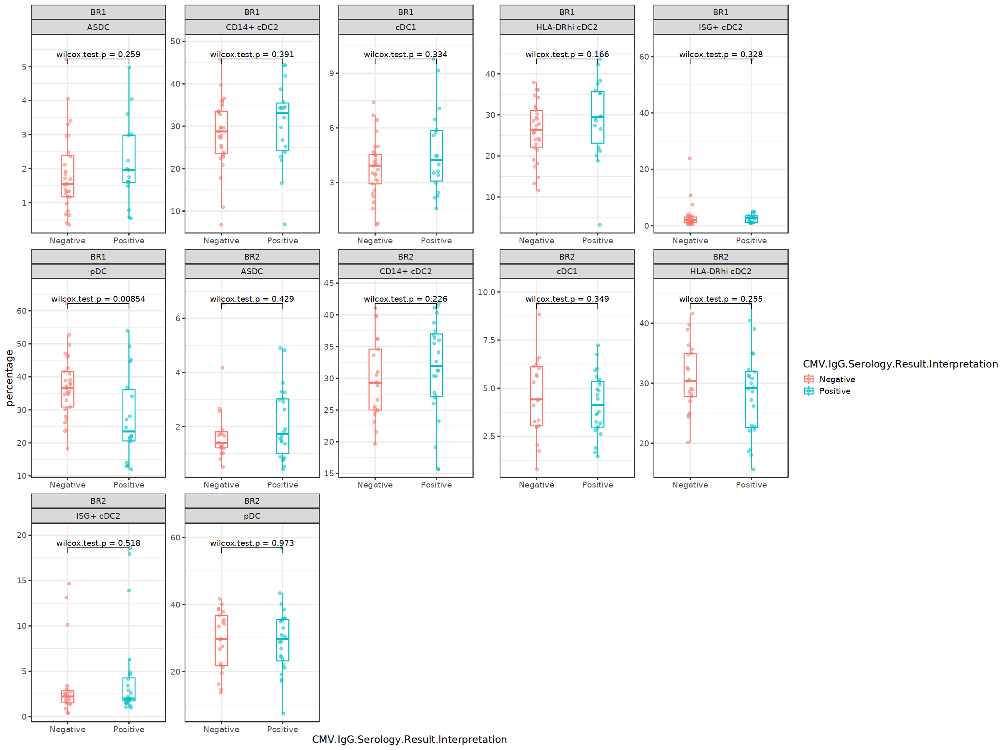

In [45]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 15)

stat.test <- DC_df %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-DC_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(DC_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

ERROR: Error in UseMethod("wilcox_test"): no applicable method for 'wilcox_test' applied to an object of class "c('grouped_df', 'tbl_df', 'tbl', 'data.frame')"


Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


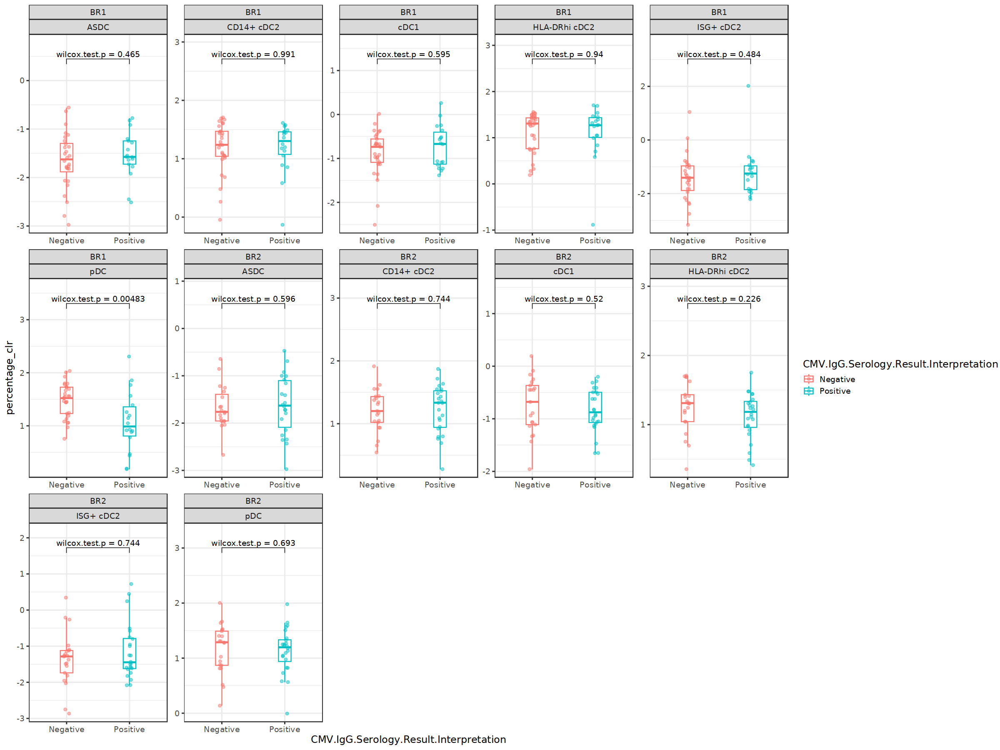

In [46]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 15)

stat.test <- DC_df %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-DC_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull() + 1


stat.test$y.position<-max_values


my_plot <- ggplot(DC_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

# Comparsion within NK cell (Percentage and Percentage CLR - AIFI Level 1 celltypes)

In [78]:
NK_df <- myeloid_df %>% filter(AIFI_L1 == 'NK cell')

In [79]:
unique(NK_df$AIFI_L1)

[1] "NK cell"

In [80]:
## Percentage of total

NK_df <- NK_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(NK_df)
#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
Adaptive NK cell,BR1001,93,7.6417420,-0.08892257
Adaptive NK cell,BR1002,50,2.4271845,-0.45897524
Adaptive NK cell,BR1003,17,1.5582035,-1.57457787
Adaptive NK cell,BR1004,12,0.8264463,-1.73975624
Adaptive NK cell,BR1005,5,1.3513514,-1.56677168
Adaptive NK cell,BR1006,32,2.1011162,-0.92182610


In [81]:
NK_df<-left_join(NK_df,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [82]:
head(NK_df)

AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
Adaptive NK cell,BR1001,93,7.6417420,-0.08892257,BR1,Female,Negative
Adaptive NK cell,BR1002,50,2.4271845,-0.45897524,BR1,Male,Negative
Adaptive NK cell,BR1003,17,1.5582035,-1.57457787,BR1,Female,Negative
Adaptive NK cell,BR1004,12,0.8264463,-1.73975624,BR1,Male,Negative
Adaptive NK cell,BR1005,5,1.3513514,-1.56677168,BR1,Female,Negative
Adaptive NK cell,BR1006,32,2.1011162,-0.92182610,BR1,Male,Negative


In [83]:
NK_df %>% filter(subject.subjectGuid == "BR1003") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

[1] 100

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


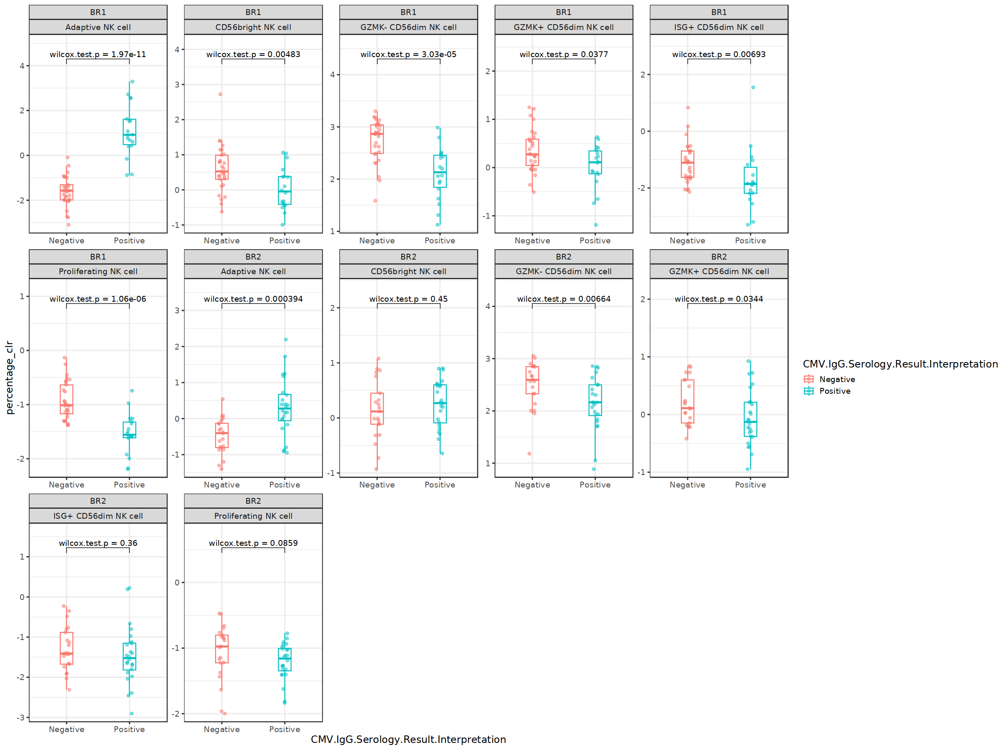

In [54]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 15)

stat.test <- NK_df %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-NK_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull() + 1


stat.test$y.position<-max_values


my_plot <- ggplot(NK_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


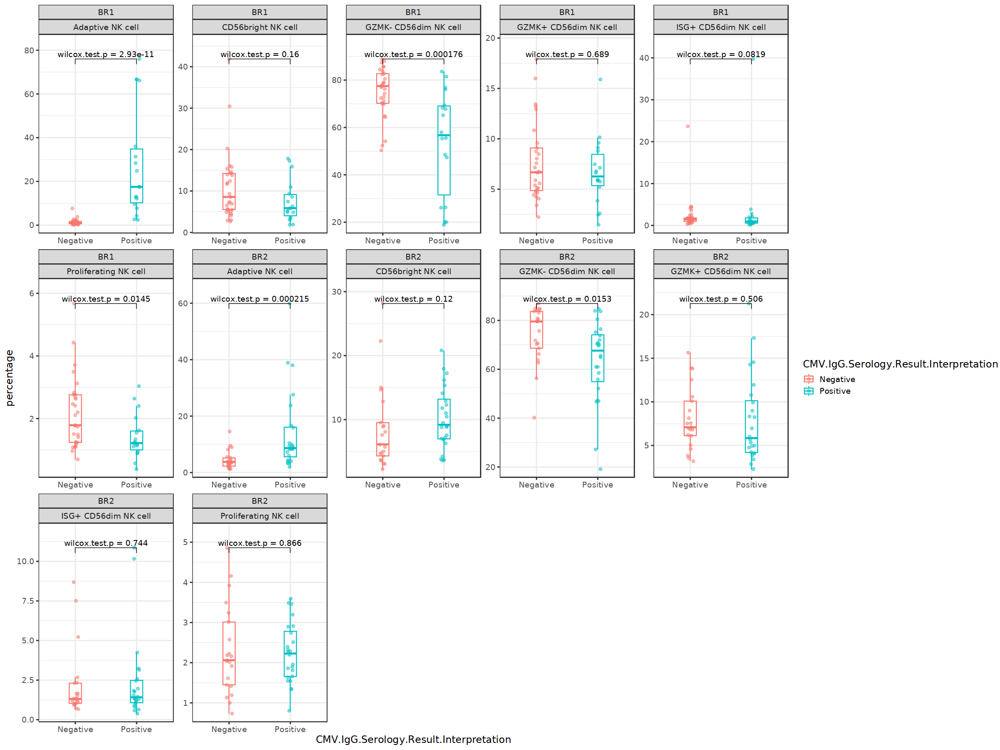

In [93]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 15)

stat.test <- NK_df %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)



max_values<-NK_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(NK_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))



my_plot

# Comparsion within Progenitor cell (Percentage and Percentage CLR - AIFI Level 1 celltypes)

In [55]:
Progenitor_df <- myeloid_df %>% filter(AIFI_L1 == 'Progenitor cell')

In [56]:
unique(Progenitor_df$AIFI_L1)

[1] "Progenitor cell"

In [58]:
## Percentage of total

Progenitor_df <- Progenitor_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(Progenitor_df)
#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
BaEoMaP cell,BR1001,1,9.090909,-0.7324082
BaEoMaP cell,BR1002,2,11.764706,-0.8796858
BaEoMaP cell,BR1005,2,5.555556,-1.2458899
BaEoMaP cell,BR1006,1,6.666667,-1.1655025
BaEoMaP cell,BR1008,1,14.285714,-0.5364793
BaEoMaP cell,BR1009,1,5.263158,-1.4479351


In [59]:
Progenitor_df<-left_join(Progenitor_df,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [60]:
head(Progenitor_df)

AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr,cohort.cohortGuid,subject.biologicalSex,CMV.IgG.Serology.Result.Interpretation
<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>
BaEoMaP cell,BR1001,1,9.090909,-0.7324082,BR1,Female,Negative
BaEoMaP cell,BR1002,2,11.764706,-0.8796858,BR1,Male,Negative
BaEoMaP cell,BR1005,2,5.555556,-1.2458899,BR1,Female,Negative
BaEoMaP cell,BR1006,1,6.666667,-1.1655025,BR1,Male,Negative
BaEoMaP cell,BR1008,1,14.285714,-0.5364793,BR1,Female,Positive
BaEoMaP cell,BR1009,1,5.263158,-1.4479351,BR1,Female,Negative


In [61]:
Progenitor_df %>% filter(subject.subjectGuid == "BR1004") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

[1] 100

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


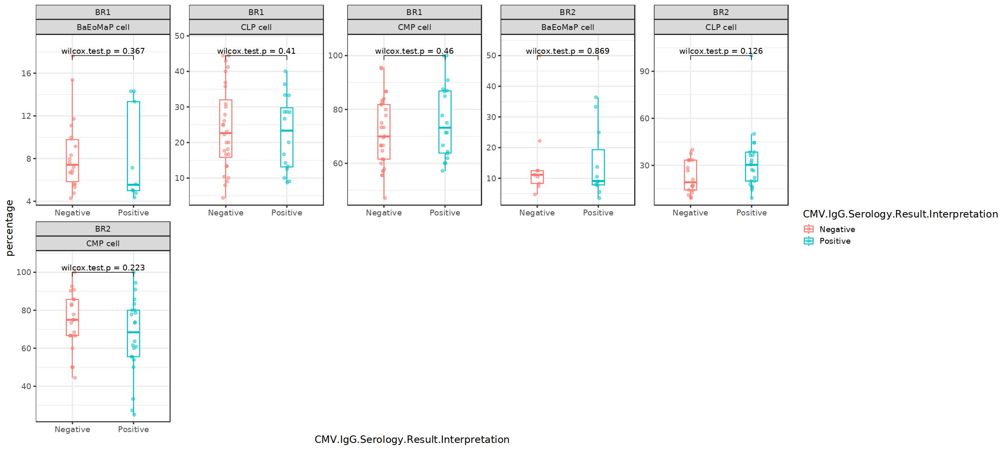

In [64]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 9)

stat.test <- Progenitor_df %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-Progenitor_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


my_plot <- ggplot(Progenitor_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

Adding missing grouping variables: `AIFI_L3`, `cohort.cohortGuid`


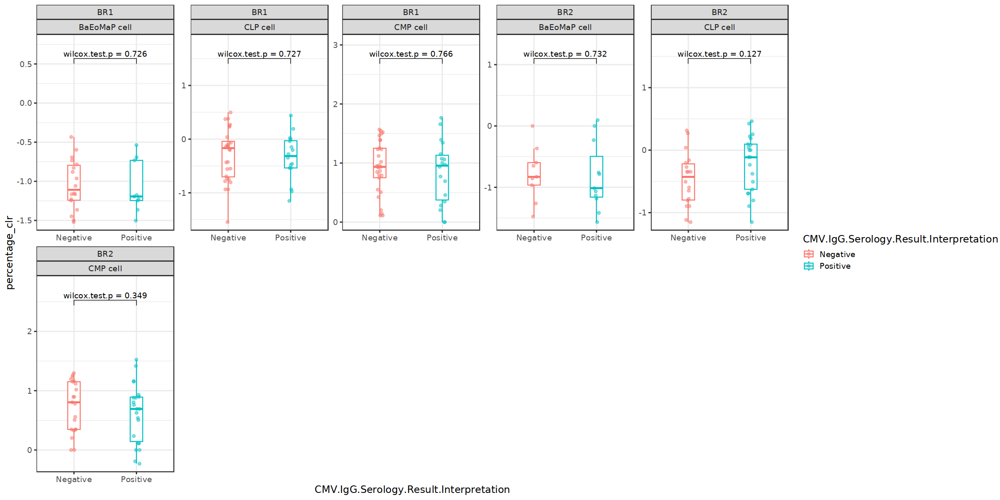

In [65]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 10)

stat.test <- Progenitor_df %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-Progenitor_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull() + 1


stat.test$y.position<-max_values


my_plot <- ggplot(Progenitor_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

In [77]:
stat.test

AIFI_L3,cohort.cohortGuid,.y.,group1,group2,n1,n2,statistic,p,y.position
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
ASDC,BR1,percentage_clr,Negative,Positive,28,17,224,7.55e-01,-1.5749975
ASDC,BR2,percentage_clr,Negative,Positive,19,22,209,1.00e+00,-1.2488429
Activated memory B cell,BR1,percentage_clr,Negative,Positive,27,14,203,7.14e-01,-0.7059636
Activated memory B cell,BR2,percentage_clr,Negative,Positive,16,20,208,1.32e-01,-0.8893950
Adaptive NK cell,BR1,percentage_clr,Negative,Positive,29,18,15,2.99e-10,3.9815586
Adaptive NK cell,BR2,percentage_clr,Negative,Positive,21,24,189,1.56e-01,3.1312659
BaEoMaP cell,BR1,percentage_clr,Negative,Positive,18,9,115,8.49e-02,-2.7460435
BaEoMaP cell,BR2,percentage_clr,Negative,Positive,9,11,60,4.56e-01,-2.5232505
C1Q+ CD16 monocyte,BR1,percentage_clr,Negative,Positive,29,18,255,9.05e-01,0.9472491


# Comparsion within Erythrocyte (Percentage and Percentage CLR - AIFI Level 1 celltypes)

In [66]:
Erythrocyte_df <- myeloid_df %>% filter(AIFI_L1 == 'Erythrocyte')

In [67]:
unique(Erythrocyte_df$AIFI_L1)

[1] "Erythrocyte"

In [68]:
## Percentage of total

Erythrocyte_df <- Erythrocyte_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

head(Erythrocyte_df)
#sum(result_Bcell$subject.subjectGuid)

`summarise()` has grouped output by 'AIFI_L3'. You can override using the
`.groups` argument.


AIFI_L3,subject.subjectGuid,count,percentage,percentage_clr
<chr>,<chr>,<int>,<dbl>,<dbl>
Erythrocyte,BR1001,12,100,-4.440892e-16
Erythrocyte,BR1002,10,100,-4.440892e-16
Erythrocyte,BR1003,10,100,-4.440892e-16
Erythrocyte,BR1004,6,100,-4.440892e-16
Erythrocyte,BR1005,11,100,-4.440892e-16
Erythrocyte,BR1006,4,100,-4.440892e-16


In [ ]:
Platelet_df<-left_join(Platelet_df,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [ ]:
head(Platelet_df)

In [ ]:
Platelet_df %>% filter(subject.subjectGuid == "BR1001") %>% 
      select(percentage) %>%
      pull() %>% 
      sum()

In [ ]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 10)

stat.test <- Platelet_df %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-Platelet_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()


stat.test$y.position<-max_values


#my_plot <- ggplot(Platelet_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
#    geom_boxplot(width = .2, outlier.shape = NA) + 
#    geom_jitter(width = .05, alpha = .5)+
#    theme_bw(base_size=14)+
#facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
#  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

library(ggplot2)
library(ggpubr)

my_plot <- ggplot(Platelet_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage, color = CMV.IgG.Serology.Result.Interpretation)) + 
  geom_boxplot(width = .2, outlier.shape = NA) + 
  geom_jitter(width = .05, alpha = .5) +
  theme_bw(base_size = 14) +
  facet_wrap(~cohort.cohortGuid + AIFI_L3, scale = "free", ncol = 5) + 
  stat_pvalue_manual(
    stat.test,
    label = "wilcox.test.p = {p}",
    tip.length = 0.02,
    tip.width = 0.01,
    hide.ns = TRUE,
    test = wilcox.test
  ) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

# Filter only statistically significant plots
my_significant_plot <- my_plot + coord_cartesian(ylim = c(NA, 0.05))

print(my_significant_plot)




In [ ]:
##percentage-CLR comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 10)

stat.test <- Platelet_df %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-Platelet_df %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage_clr))%>% select(percentage_clr) %>% pull() + 1


stat.test$y.position<-max_values


my_plot <- ggplot(Platelet_df, aes(CMV.IgG.Serology.Result.Interpretation, percentage_clr,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot

In [ ]:
###ROUGH WORK

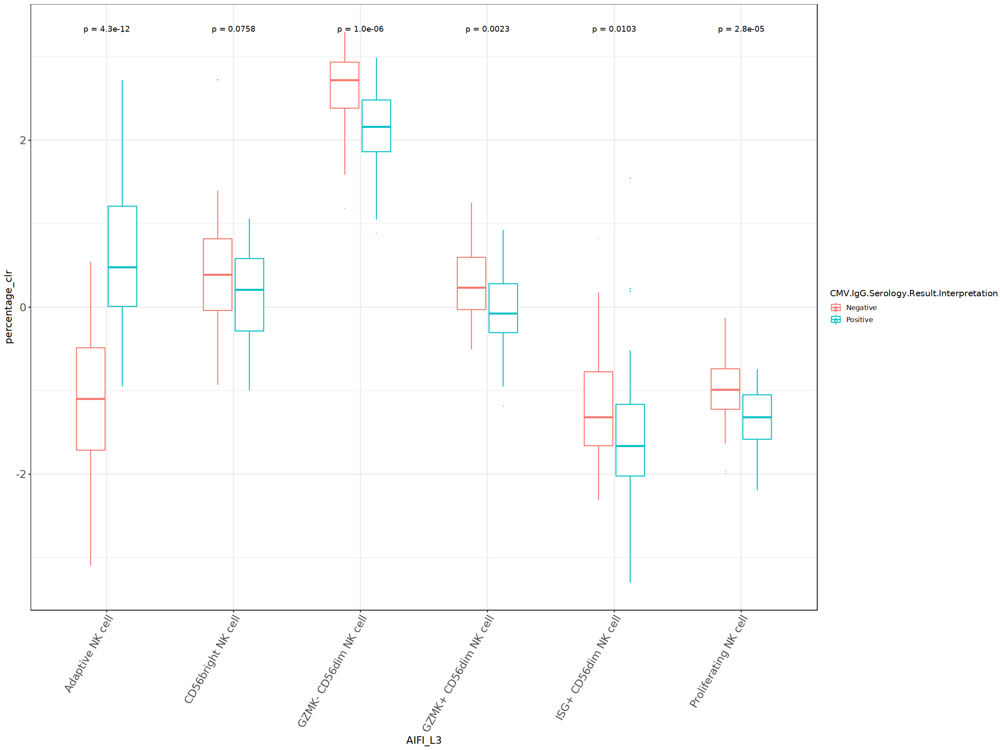

In [120]:
p4 <- ggplot(NK_df, aes(x = AIFI_L3, y = percentage_clr, color = CMV.IgG.Serology.Result.Interpretation)) + 
  geom_boxplot(width = .5, outlier.shape = '.') + 
  scale_x_discrete(name ="AIFI_L3", guide = guide_axis(angle = 60)) + 
  theme_bw(base_size = 12) +
  theme(axis.text = element_text(size = 15), axis.title = element_text(size = 14)) +
  stat_compare_means(aes(group = CMV.IgG.Serology.Result.Interpretation), method = "wilcox.test", label = "p") 

p4

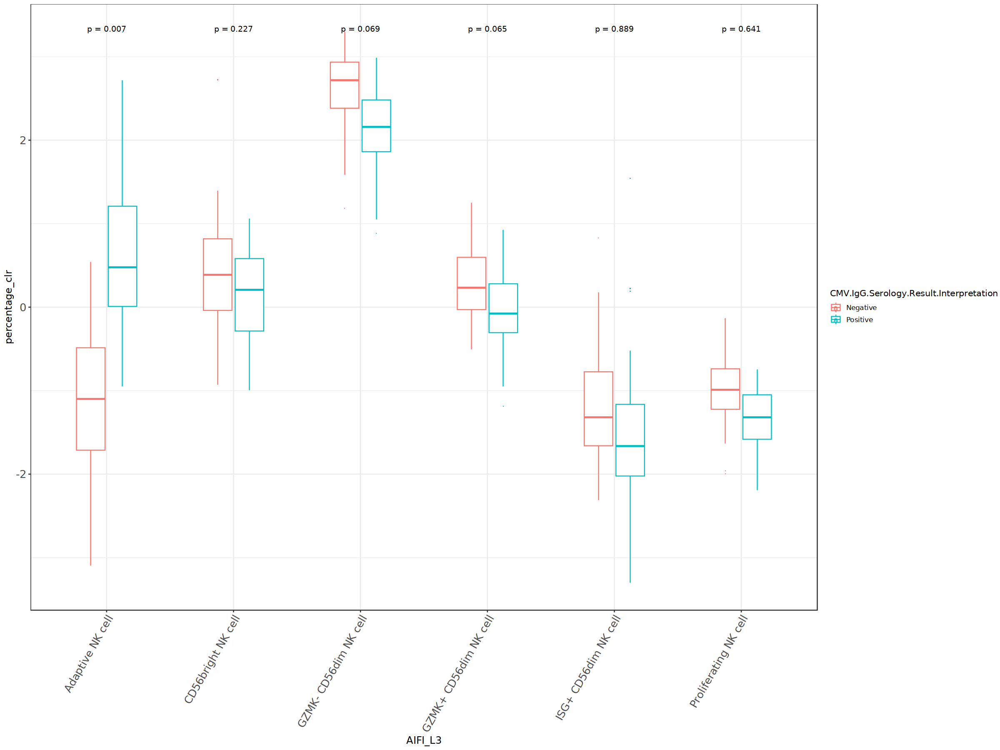

In [126]:
p4 <- ggplot(NK_df, aes(x = AIFI_L3, y = percentage_clr, color = CMV.IgG.Serology.Result.Interpretation)) + 
  geom_boxplot(width = .5, outlier.shape = '.') + 
  scale_x_discrete(name ="AIFI_L3", guide = guide_axis(angle = 60)) + 
  theme_bw(base_size = 12) +
  theme(axis.text = element_text(size = 15), axis.title = element_text(size = 14)) +
  stat_compare_means(aes(group = CMV.IgG.Serology.Result.Interpretation), method = "wilcox.test", label = "p") 

p4

Warning message:
“Unknown or uninitialised column: `p`.”
Warning message:
“Computation failed in `stat_compare_means()`
Caused by error:
! argument "x" is missing, with no default”
Warning message:
“Unknown or uninitialised column: `p`.”
Warning message:
“Computation failed in `stat_compare_means()`
Caused by error:
! argument "x" is missing, with no default”


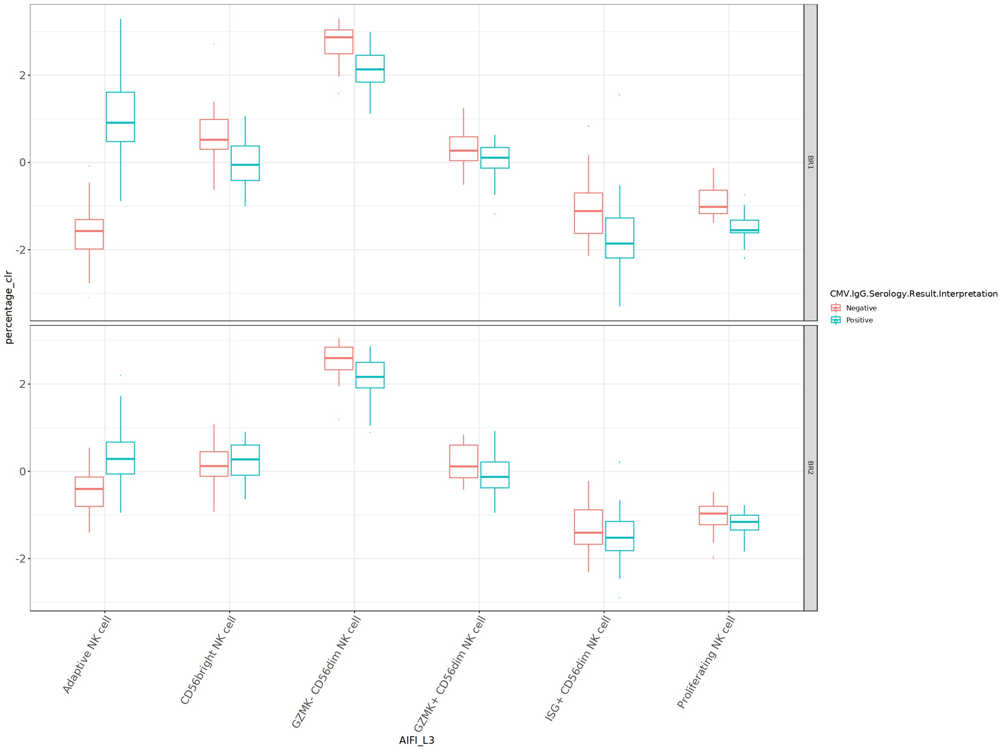

In [129]:
p4 <- ggplot(NK_df, aes(x = AIFI_L3, y = percentage_clr, color = CMV.IgG.Serology.Result.Interpretation)) + 
  geom_boxplot(width = .5, outlier.shape = '.') + 
  scale_x_discrete(name ="AIFI_L3", guide = guide_axis(angle = 60)) + 
  theme_bw(base_size = 12) +
  theme(axis.text = element_text(size = 15), axis.title = element_text(size = 14)) +
  stat_compare_means(aes(group = cohort.cohortGuid), method = "wilcox.test", label = "p") +
  facet_grid(cohort.cohortGuid ~ ., scales = "free_y", space = "free_y")  # Use facet_grid for separate plots

# Display the plot
print(p4)


In [128]:
install.packages("ggpubr")
library(ggpubr)


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



Loading required package: survival


Attaching package: ‘coin’


The following objects are masked from ‘package:rstatix’:

    chisq_test, friedman_test, kruskal_test, sign_test, wilcox_test




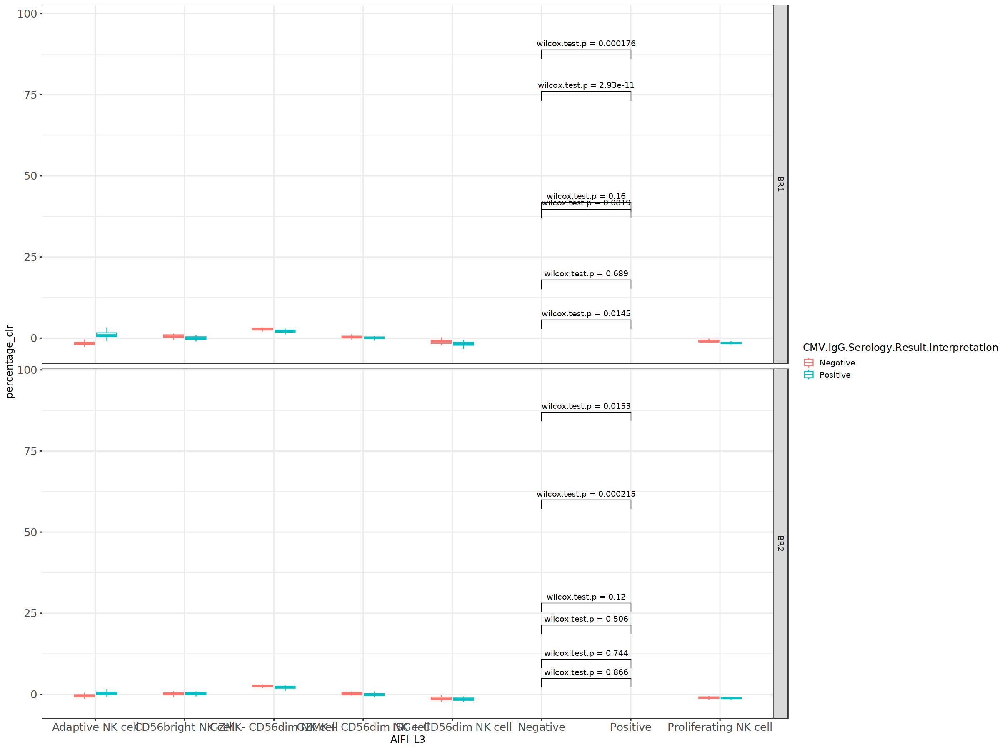

In [141]:
library(tidyverse)
library(coin)

options(repr.plot.width = 20, repr.plot.height = 15)

# Assuming percentage_clr is a valid variable in NK_df
p4 <- ggplot(NK_df, aes(x = AIFI_L3, y = percentage_clr, color = CMV.IgG.Serology.Result.Interpretation)) + 
  geom_boxplot(width = .5, outlier.shape = NA) + 
  theme_bw(base_size = 14) +
  theme(axis.text = element_text(size = 15), axis.title = element_text(size = 14)) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15))) +
  facet_grid(cohort.cohortGuid ~ ., scales = "free_y", space = "free_y") +
  stat_pvalue_manual(stat.test, label = "wilcox.test.p = {p}")

p4


In [ ]:
result <- all_df_subset %>%
  dplyr::group_by(celltypes, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) %>%                  # Count occurrences
  dplyr::group_by(subject.subjectGuid) %>%                       
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(subject.subjectGuid) %>%     
  dplyr::mutate(percentage_clr = clr_transform((percentage))) %>% # Group again by subjectGuid for CLR# Calculate percentage
  dplyr::ungroup()

In [ ]:
result<-left_join(result,unique(all_df_subset[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))
result<-result %>% filter(!celltypes=="gdT")

In [ ]:
#percentage
options(repr.plot.width = 18, repr.plot.height = 12)
stat.test <- result %>% select(percentage,celltypes,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(celltypes) %>%
  wilcox_test(percentage ~ cohort.cohortGuid)

max_values<-result %>%
  group_by(celltypes) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()+1
stat.test$y.position<-max_values
ggplot(result , aes(cohort.cohortGuid, percentage,color=cohort.cohortGuid)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+scale_color_d3()+
facet_wrap(~celltypes,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

In [ ]:
#result %>% filter(subject.subjectGuid == "BR1001") %>% 
    #  pull() %>% 
     # sum()

In [ ]:
result <- myeloid_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) 

head(result)
sum(result$count)

In [ ]:
result<- result %>%
  dplyr::group_by(subject.subjectGuid) %>%
  dplyr::mutate(percentage = (count / sum(count)) * 100)
  

sum(result$count)
head(result)

In [ ]:
subset_df <- myeloid_df[, c('AIFI_L1', 'AIFI_L3','subject.subjectGuid' )]

In [ ]:
head(subset_df)

In [ ]:
result_subset <- subset_df %>%
  dplyr::group_by(AIFI_L1, subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) 

head(result_subset)
sum((result_subset$count))

In [ ]:
result_subset <- subset_df %>%
  dplyr::group_by(AIFI_L1, AIFI_L3,  subject.subjectGuid) %>%               
  dplyr::summarise(count = n()) 

head(result_subset)
sum((result_subset$count))

In [ ]:
#######TALLY METHOD

In [ ]:
tally_df <- tally(group_by(subset_df, AIFI_L1, AIFI_L3, subject.subjectGuid ))

In [ ]:
sum(tally_df$n)

In [ ]:
# Calculate the total number of cells
total_cells <- sum(tally_df$n)

# Calculate the percentage relative to the total number of cells
tally_df <- tally_df %>%
  mutate(percentage = (n / total_cells) * 100)

print(tally_df)
sum(tally_df$n)

In [ ]:
tally_df <- tally_df %>%
  group_by(AIFI_L1, AIFI_L3) %>%
  mutate(percentage = (n / sum(n)) * 100) %>%
  ungroup()

print(tally_df)

In [ ]:
tally_df_B_cell <- tally_df %>% filter(AIFI_L1 == 'B cell')

In [ ]:
tally_df_B_cell
sum(tally_df_B_cell$n)

In [ ]:
tally_df_B_cell <- tally_df_B_cell %>%
  group_by(AIFI_L1, AIFI_L3) %>%
  mutate(percentage = (n / sum(n)) * 100) %>%
  ungroup()

print(tally_df_B_cell)

In [ ]:
result_2 <- myeloid_df %>%
  dplyr::group_by(AIFI_L3, subject.subjectGuid) %>%               
  dplyr::summarise(count_AIFI_L3 = n()) 

head(result_2)

In [ ]:
merged_df <- left_join(result, result_2, by = "subject.subjectGuid", all = TRUE)

In [ ]:
head(merged_df)


In [ ]:
result<-left_join(result_2,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [76]:
#kable(table(myeloid_df$AIFI_L1))
kable(table(myeloid_df$AIFI_L3))
#kable(table(subset_df$AIFI_L1))



|Var1                                 |   Freq|
|:------------------------------------|------:|
|Activated memory B cell              |    343|
|Adaptive NK cell                     |  13739|
|ASDC                                 |    343|
|BaEoMaP cell                         |     69|
|C1Q+ CD16 monocyte                   |   3677|
|CD14+ cDC2                           |   6054|
|CD27- effector B cell                |   3735|
|CD27+ effector B cell                |   5827|
|CD4 MAIT                             |   2860|
|CD56bright NK cell                   |  10141|
|CD8 MAIT                             |  37046|
|CD8aa                                |   2446|
|CD95 memory B cell                   |   2083|
|cDC1                                 |    846|
|CLP cell                             |    297|
|CM CD4 T cell                        | 157562|
|CM CD8 T cell                        |  22083|
|CMP cell                             |    995|
|Core CD14 monocyte                   

In [ ]:
sum(table(myeloid_df$AIFI_L1))


In [75]:
library("knitr")

In [ ]:
#debugging
result <- myeloid_df %>%
  dplyr::group_by(AIFI_L1, subject.subjectGuid) %>%               
  dplyr::summarise(AIFI_L1_count = n()) 
  #dplyr::mutate(percentage = (count / sum(count)) * 100)

#sum(result$count)
head(result)

In [ ]:
#for total PBMC
result <- myeloid_df %>%
  dplyr::group_by(AIFI_L3) %>%                        # Group by cell type
  dplyr::summarise(count = n()) %>%                  # Count occurrences for each cell type
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::ungroup() %>%
  dplyr::mutate(percentage_clr = clr_transform(percentage)) # Apply CLR transformation

head(result)

In [ ]:
#of parent cell type (AIFI_L1)
result_cell_types_within_parent <- myeloid_df %>%
  dplyr::group_by(AIFI_L1, AIFI_L3) %>%               # Group by parent cell type and cell type
  dplyr::summarise(count = n()) %>%                  # Count occurrences for each cell type within its parent
  dplyr::mutate(percentage = (count / sum(count)) * 100) %>% 
  dplyr::group_by(AIFI_L1) %>%                       
  dplyr::mutate(percentage_clr = clr_transform(percentage)) %>% # Apply CLR transformation
  dplyr::ungroup()


In [ ]:
####Loop code to consider the parent types 

In [ ]:
result

In [ ]:
result<-left_join(result,unique(myeloid_df[c('cohort.cohortGuid','subject.subjectGuid','subject.biologicalSex','CMV.IgG.Serology.Result.Interpretation')]),by=c('subject.subjectGuid'))

In [ ]:
head(result)
unique(result$cohort.cohortGuid)

In [ ]:
results <- myeloid_df %>%
     dplyr::group_by(AIFI_L1, AIFI_L3, subject.subjectGuid ) %>% 
    dplyr::count(AIFI_L1 )
    
head(results)

In [ ]:
rownames(stat.test)

In [ ]:
########Stat test (Wilcoxon) and Boxplot

In [ ]:
stat.test <- result %>% select(percentage_clr,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage_clr ~ CMV.IgG.Serology.Result.Interpretation)



In [ ]:
head(stat.test)

In [ ]:
ggsave("/home/jupyter/Myeloid_cells/Plots/AIFI_L3_CMVcompare_allCohorts_percentage_clr.png", plot = my_plot, width = 15, height = 49, units = "in", dpi = 300)

In [ ]:
##percentage comparsion by CMV 

options(repr.plot.width = 20, repr.plot.height = 100)

stat.test <- result %>% select(percentage,AIFI_L3,CMV.IgG.Serology.Result.Interpretation,cohort.cohortGuid)%>%
    unique(.)%>% 
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  wilcox_test(percentage ~ CMV.IgG.Serology.Result.Interpretation)


max_values<-result %>%
  group_by(AIFI_L3,cohort.cohortGuid) %>%
  slice(which.max(percentage))%>% select(percentage) %>% pull()+1


stat.test$y.position<-max_values


my_plot <- ggplot(result, aes(CMV.IgG.Serology.Result.Interpretation, percentage,color=CMV.IgG.Serology.Result.Interpretation)) + 
    geom_boxplot(width = .2, outlier.shape = NA) + 
    geom_jitter(width = .05, alpha = .5)+
    theme_bw(base_size=14)+
facet_wrap(~cohort.cohortGuid+AIFI_L3,scale="free",ncol=5)+ stat_pvalue_manual(stat.test,label = "wilcox.test.p = {p}")+
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.15)))

my_plot